In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import copy

from test_simplify import test_basic, load_net, batch_predict
from test_batch import collect_predict,adaptive_chain_smoother,load_predict

In [2]:
%matplotlib inline

%load_ext autoreload
%autoreload 2

In [3]:
def plot_trace(x,y, alpha=1.0):
    n = x.shape[0]
    plt.plot(x[:n//3],y[:n//3],'-o',color='r', alpha=alpha)
    plt.plot(x[n//3:n//3*2],y[n//3:n//3*2],'-o',color='g', alpha=alpha)
    plt.plot(x[n//3*2:],y[n//3*2:],'-o',color='b', alpha=alpha)


In [4]:
net = load_net('weights/ssd300_hor_3.pth')

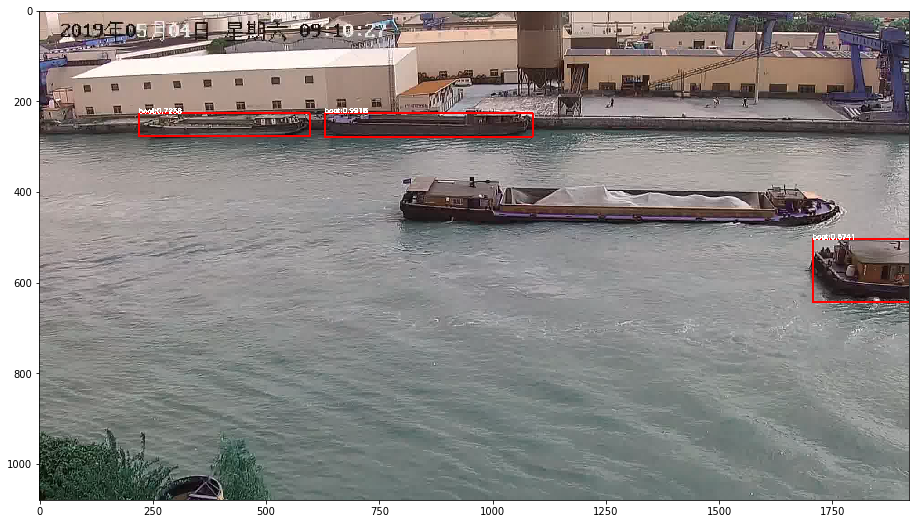

In [6]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00801_frames\thumb00088.jpg')
plt.figure(figsize=(16,9))
plt.imshow(processed)

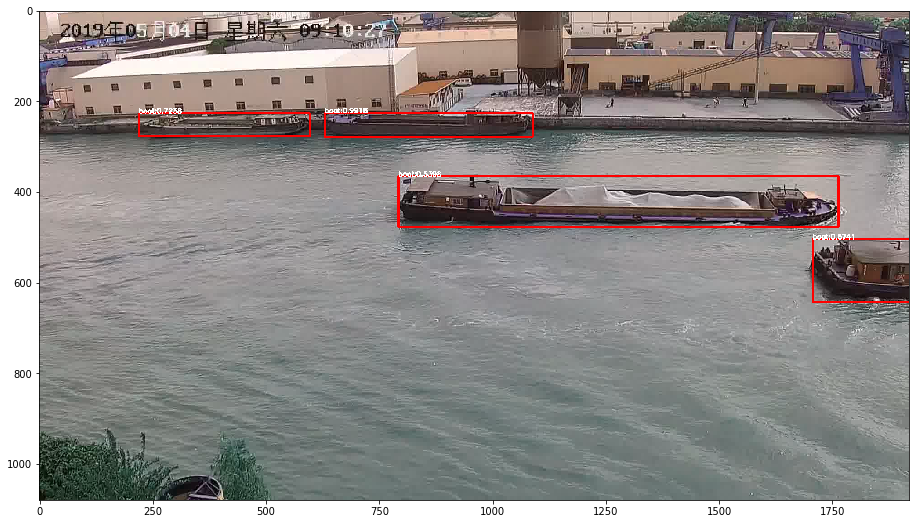

In [7]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00801_frames\thumb00088.jpg', threshold=0.15)
plt.figure(figsize=(16,9))
plt.imshow(processed)

In [8]:
smoother = lambda arr: adaptive_chain_smoother(arr, F=6)

In [10]:
loaded_raw = load_predict('hiv00801_cache')

In [11]:
loaded = copy.deepcopy(loaded_raw)
collected = collect_predict(loaded, chain_smoother=smoother, jump_tol=60, verbose=True)
sorted([len(chain) for chain in collected['chain_list']], reverse=True)

28 chain detected


[12951,
 12951,
 1574,
 1417,
 1358,
 1266,
 1226,
 1210,
 893,
 863,
 852,
 763,
 735,
 710,
 655,
 563,
 546,
 545,
 545,
 513,
 362,
 180,
 25,
 7,
 4,
 2,
 2,
 1]

12951


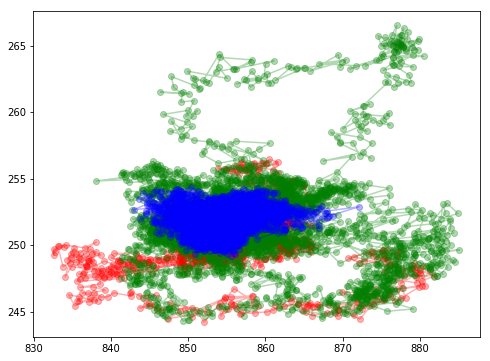

12951


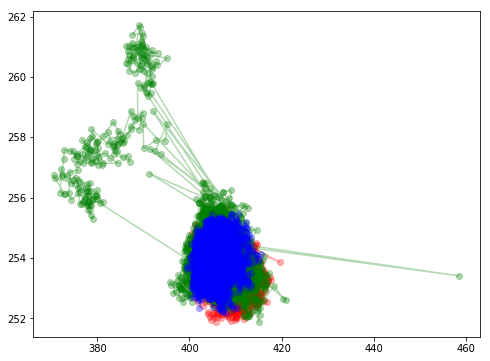

1574


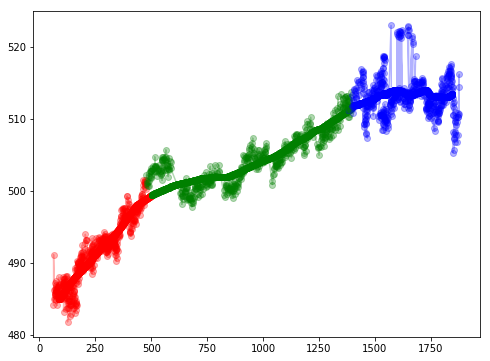

1417


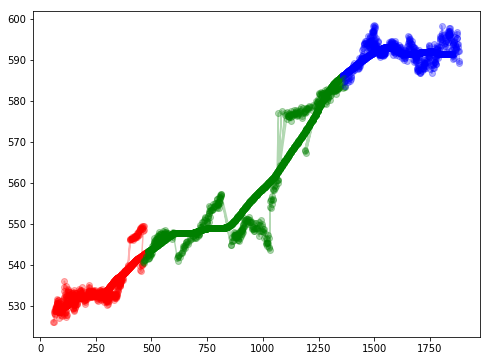

1358


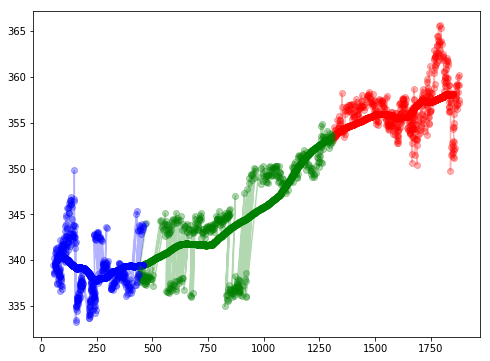

1266


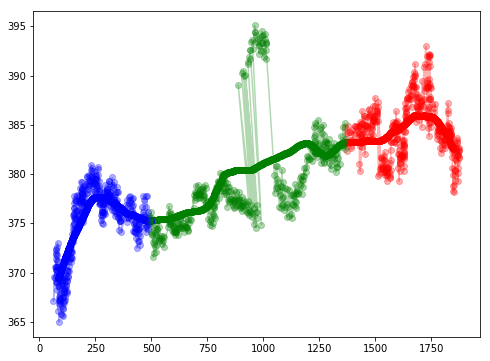

1226


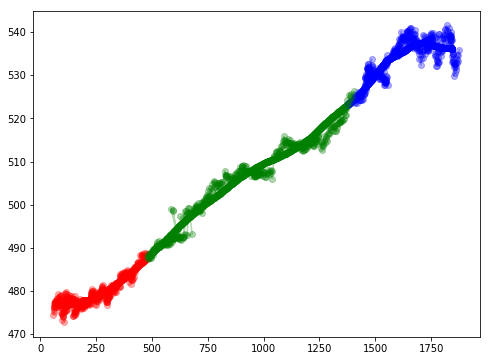

1210


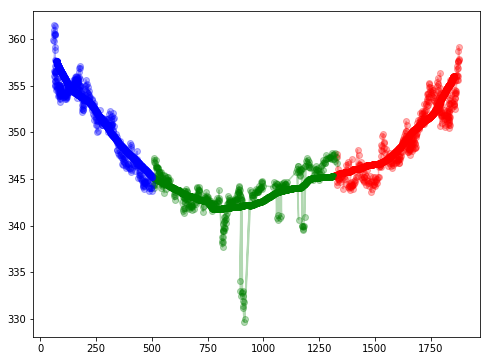

893


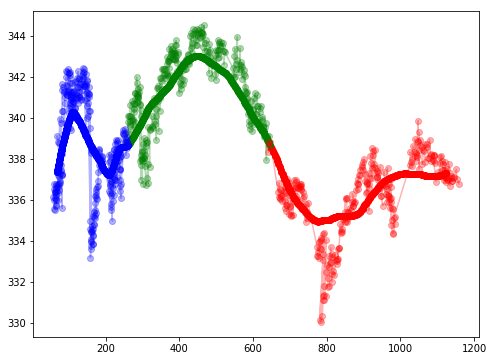

863


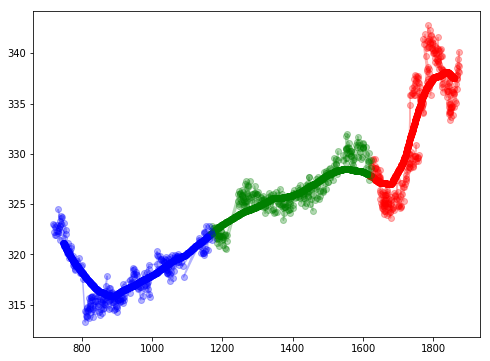

852


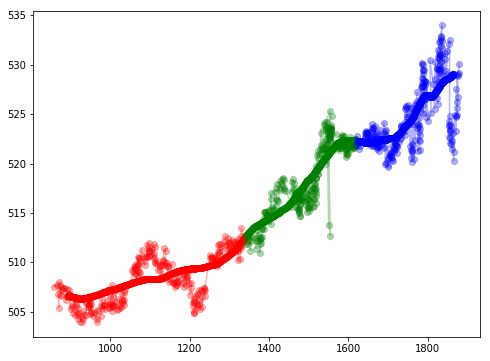

763


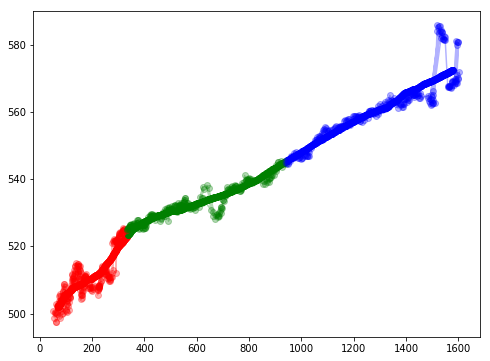

735


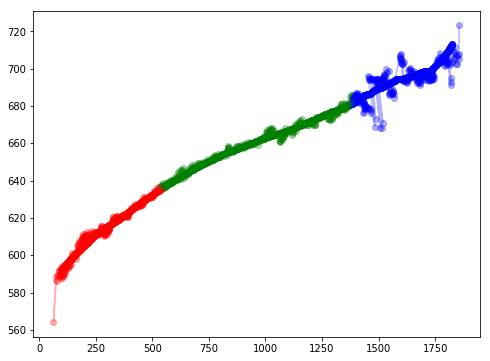

710


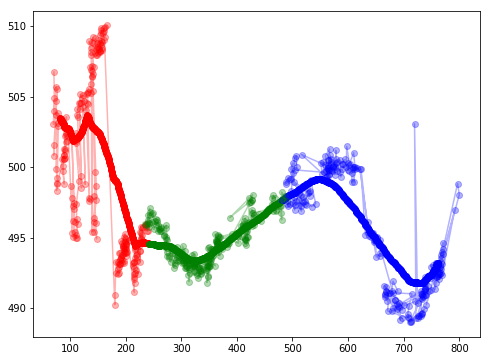

655


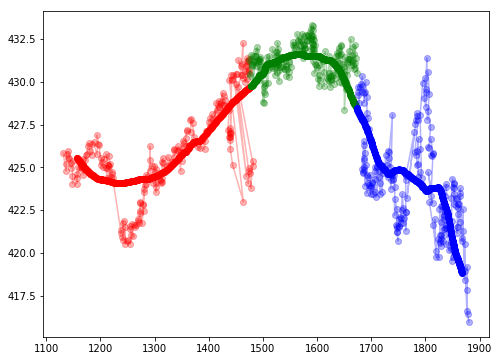

563


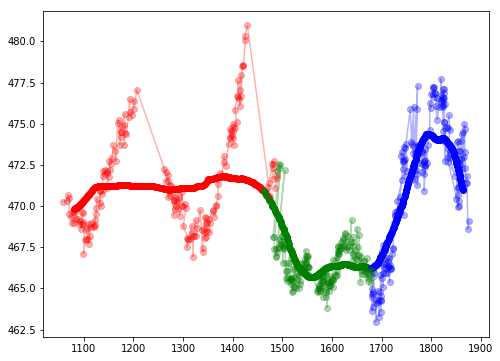

546


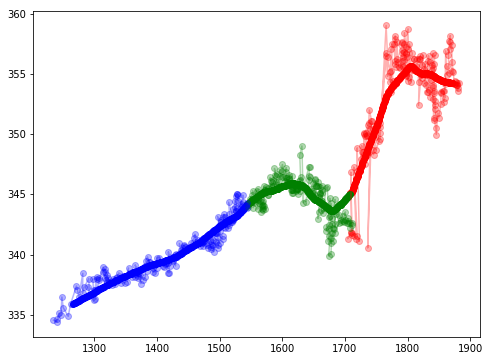

545


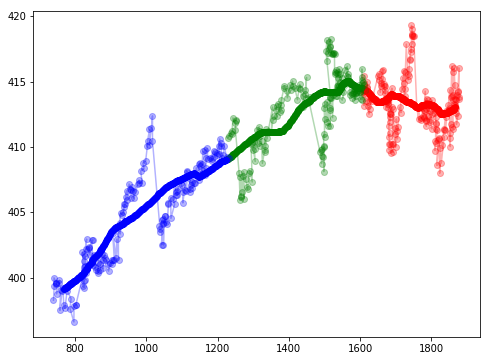

545


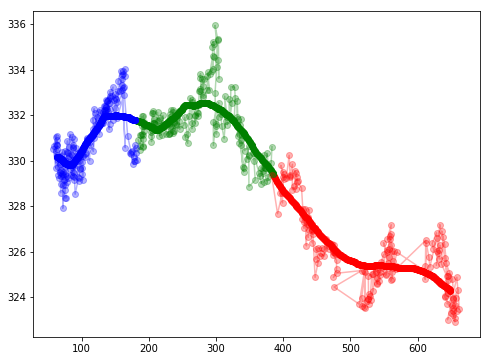

513


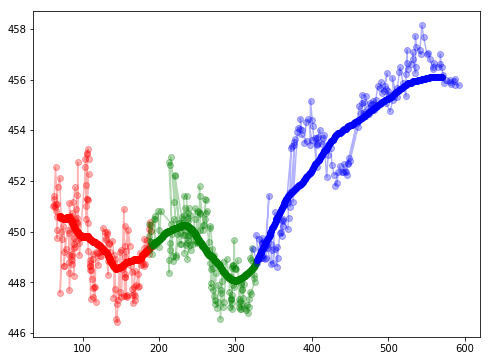

362


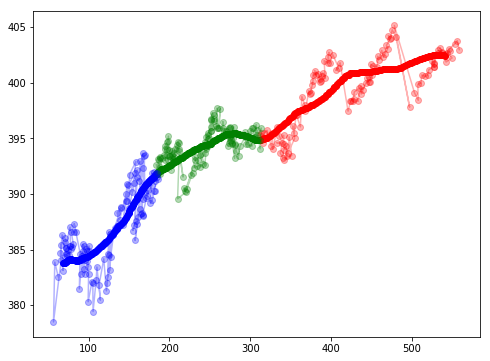

In [12]:
for chain in sorted([chain for chain in collected['chain_list']], reverse=True, key=len)[:21]:
    pt_arr = np.array([box['pt'] for box in chain])
    pt_smoothed_arr = np.array([box['pt_smoothed'] for box in chain])
    if len(pt_arr) <2:
        print('suppressed')
        continue
    print(len(pt_arr))
    x,y = pt_arr[:,::2].mean(axis=1),pt_arr[:,1::2].mean(axis=1)
    x_bar,y_bar = pt_smoothed_arr[:,::2].mean(axis=1),pt_smoothed_arr[:,1::2].mean(axis=1)
    
    plt.figure(figsize=(8,6))
    plot_trace(x_bar, y_bar)
    plot_trace(x,y, alpha=0.3)
    plt.show()

In [13]:
background_bgr = cv2.imread('hor_background2.jpg')
background = cv2.cvtColor(background_bgr, cv2.COLOR_BGR2RGB)

12951


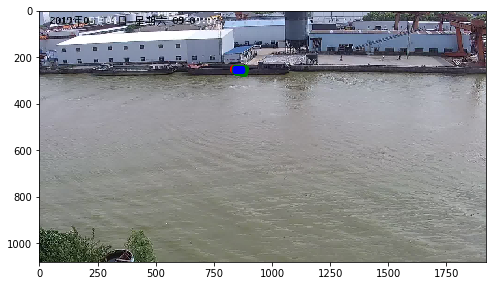

12951


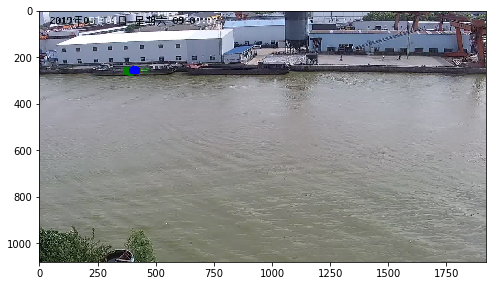

1574


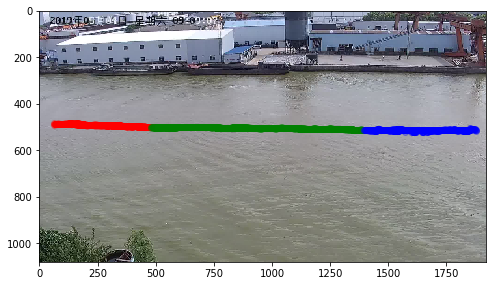

1417


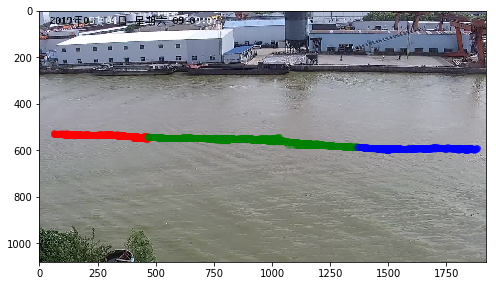

1358


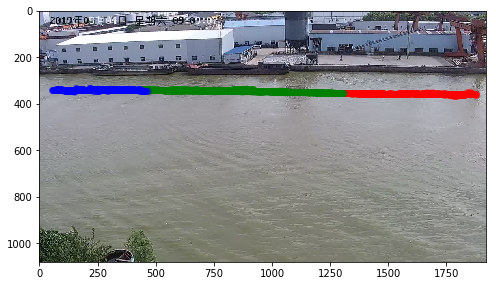

1266


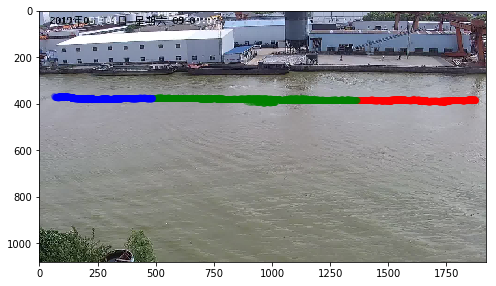

1226


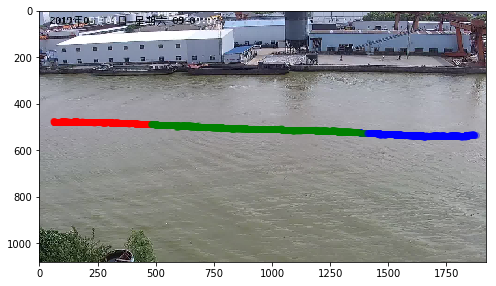

1210


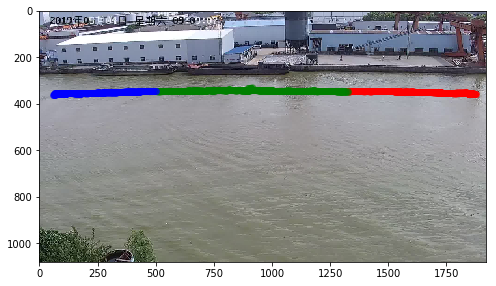

893


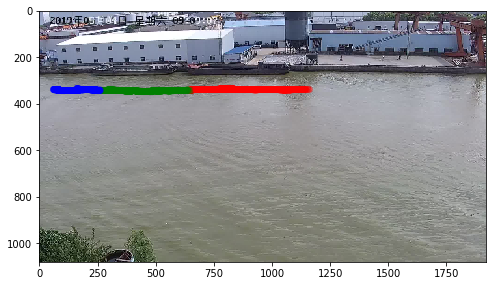

863


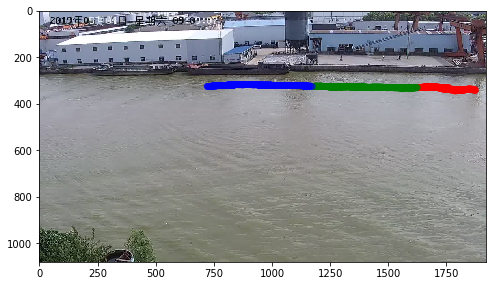

852


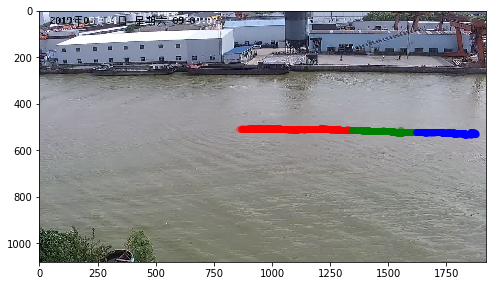

763


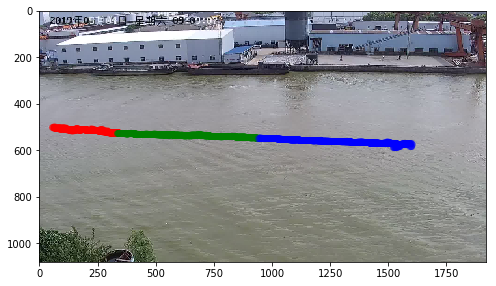

735


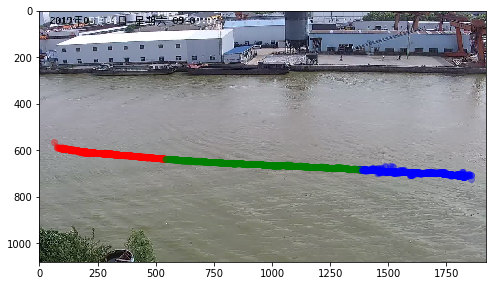

710


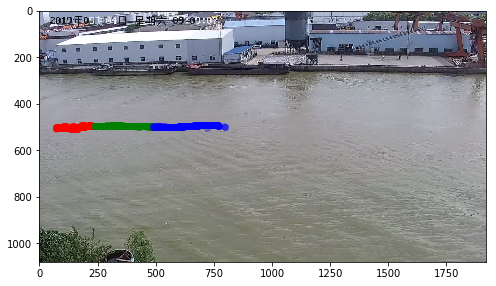

655


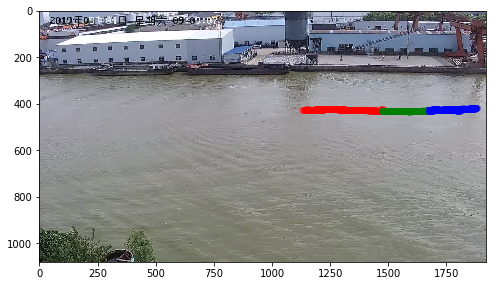

563


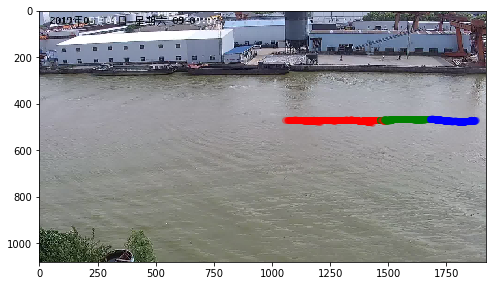

546


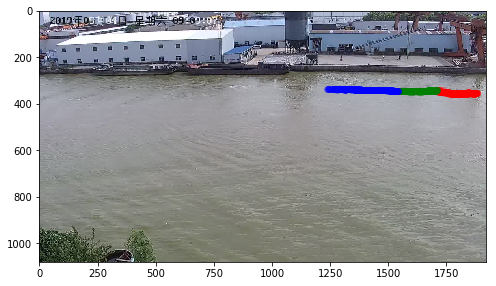

545


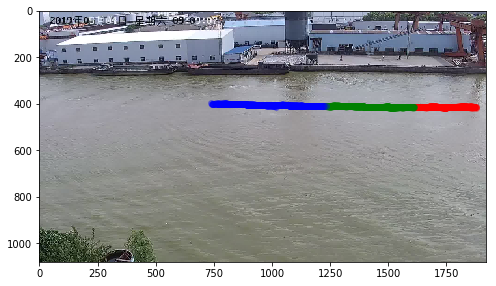

545


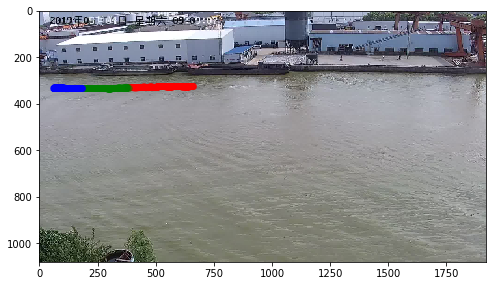

513


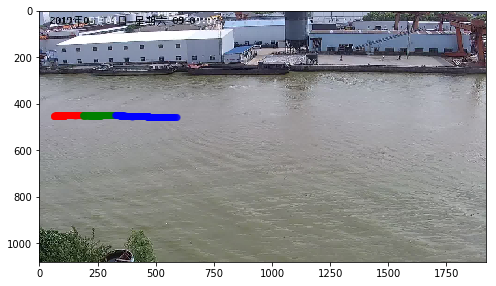

362


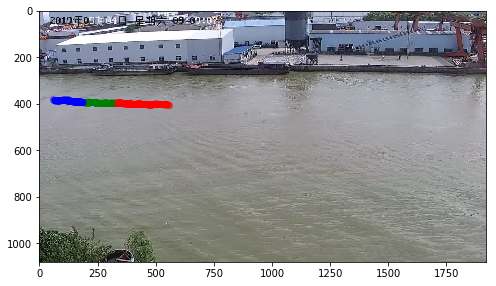

In [14]:
for chain in sorted([chain for chain in collected['chain_list']], reverse=True, key=len)[:21]:
    pt_arr = np.array([box['pt'] for box in chain])
    pt_smoothed_arr = np.array([box['pt_smoothed'] for box in chain])
    if len(pt_arr) <2:
        print('suppressed')
        continue
    print(len(pt_arr))
    x,y = pt_arr[:,::2].mean(axis=1),pt_arr[:,1::2].mean(axis=1)
    x_bar,y_bar = pt_smoothed_arr[:,::2].mean(axis=1),pt_smoothed_arr[:,1::2].mean(axis=1)
    
    plt.figure(figsize=(8,6))
    plot_trace(x_bar, y_bar)
    plot_trace(x,y, alpha=0.3)
    plt.imshow(background)
    plt.show()

In [30]:
loaded = copy.deepcopy(loaded_raw)
collected = collect_predict(loaded, chain_smoother=smoother, jump_tol=120, verbose=True, pixel_threshold=100)
sorted([len(chain) for chain in collected['chain_list']], reverse=True)

19 chain detected


[12951,
 12951,
 1574,
 1562,
 1439,
 1418,
 1408,
 1365,
 1266,
 1226,
 1210,
 911,
 763,
 735,
 655,
 588,
 515,
 180,
 2]

12951


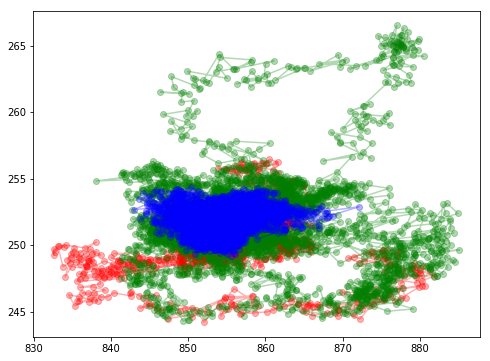

12951


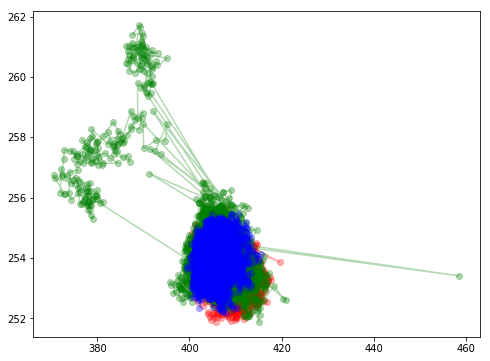

1574


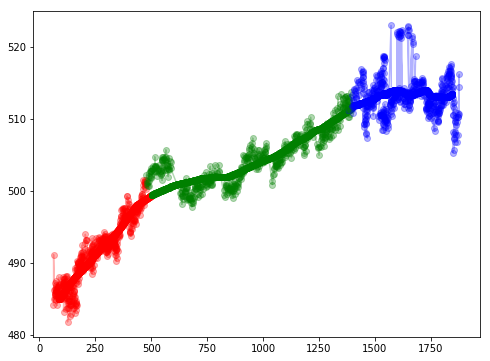

1562


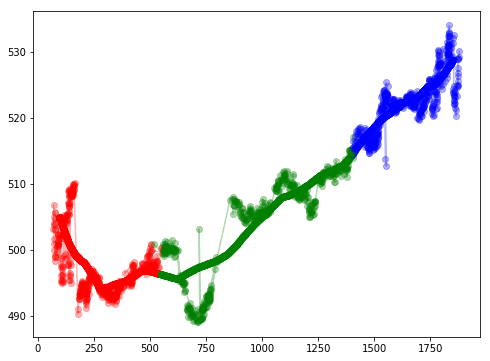

1439


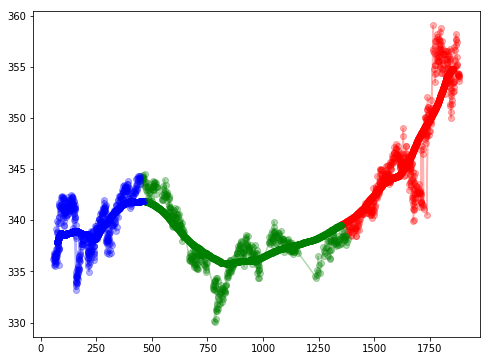

1418


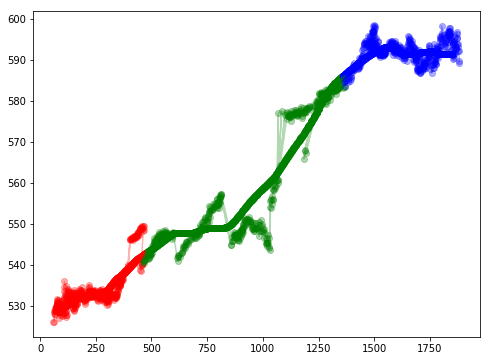

1408


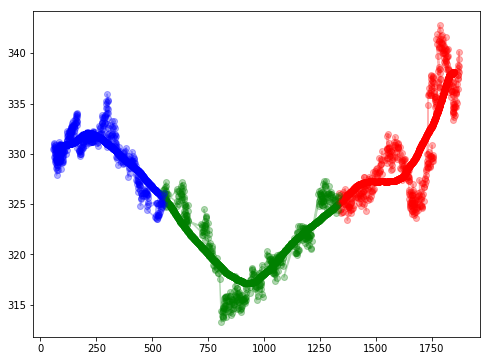

1365


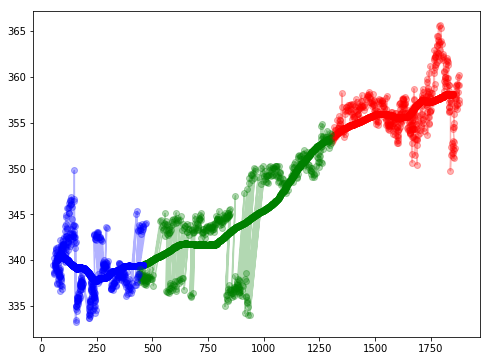

1266


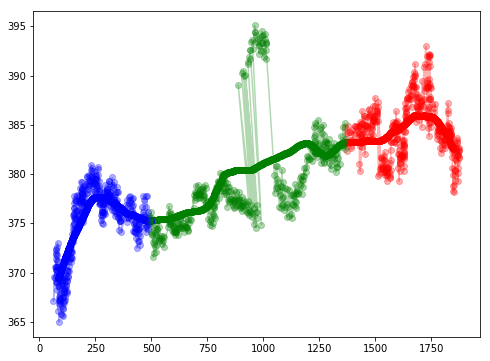

1226


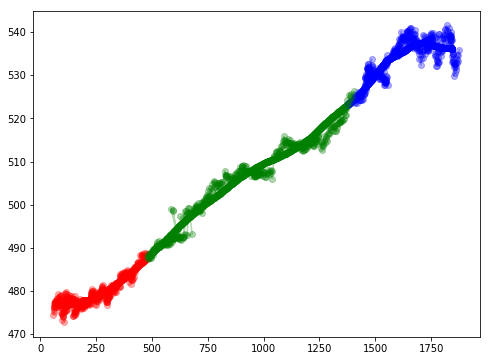

1210


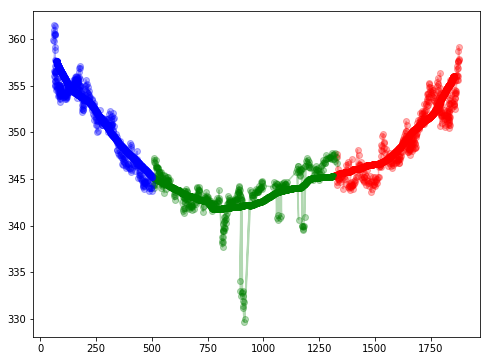

911


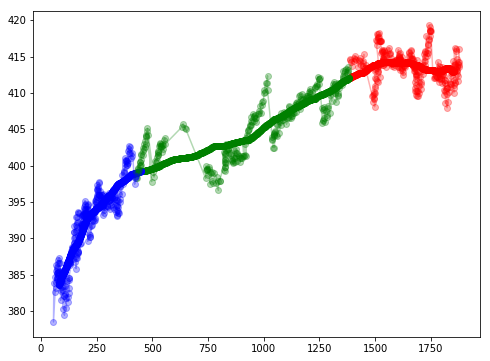

763


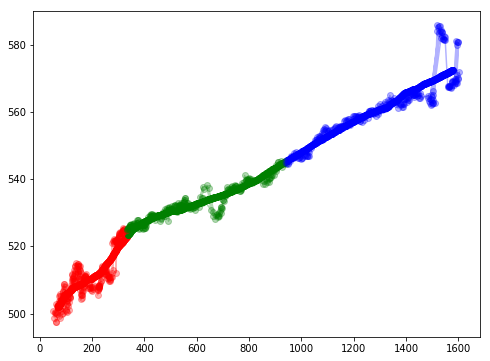

735


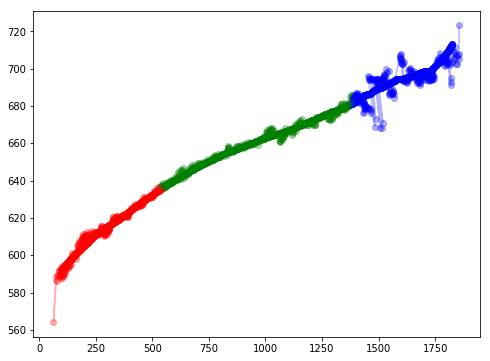

655


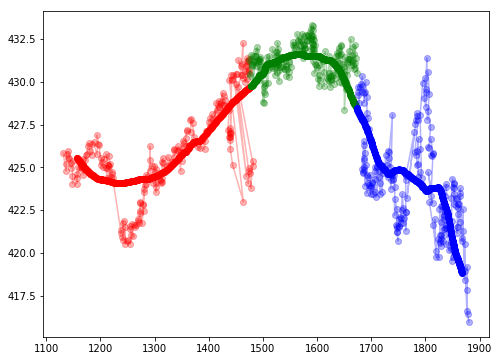

588


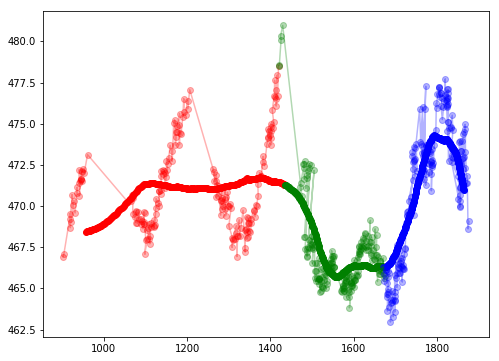

515


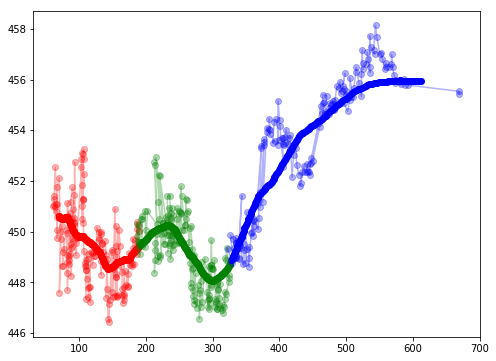

180


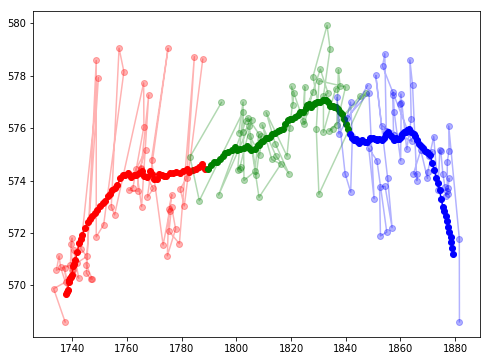

2


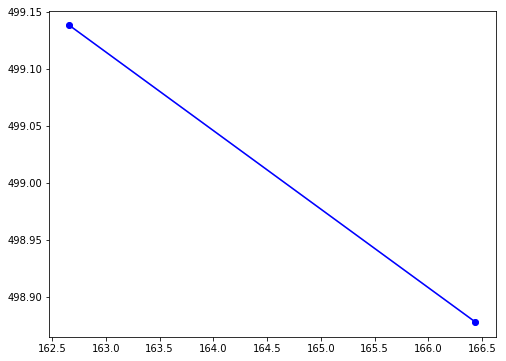

In [31]:
for chain in sorted([chain for chain in collected['chain_list']], reverse=True, key=len)[:21]:
    pt_arr = np.array([box['pt'] for box in chain])
    pt_smoothed_arr = np.array([box['pt_smoothed'] for box in chain])
    if len(pt_arr) <2:
        print('suppressed')
        continue
    print(len(pt_arr))
    x,y = pt_arr[:,::2].mean(axis=1),pt_arr[:,1::2].mean(axis=1)
    x_bar,y_bar = pt_smoothed_arr[:,::2].mean(axis=1),pt_smoothed_arr[:,1::2].mean(axis=1)
    
    plt.figure(figsize=(8,6))
    plot_trace(x_bar, y_bar)
    plot_trace(x,y, alpha=0.3)
    plt.show()

0 12951


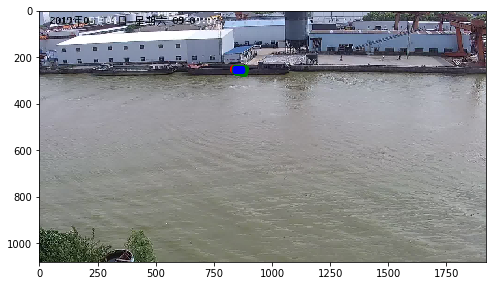

1 12951


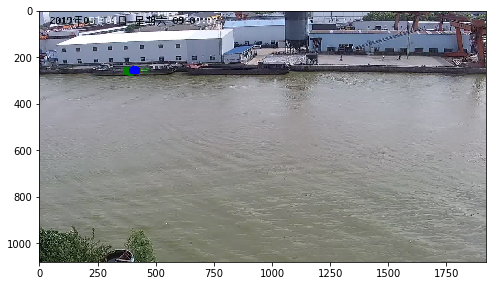

2 1574


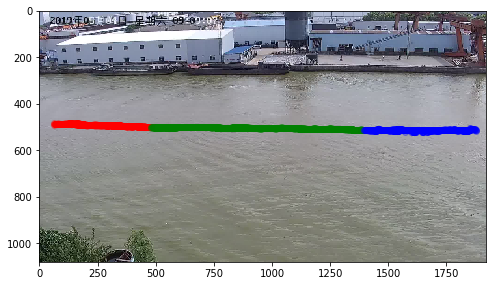

3 1562


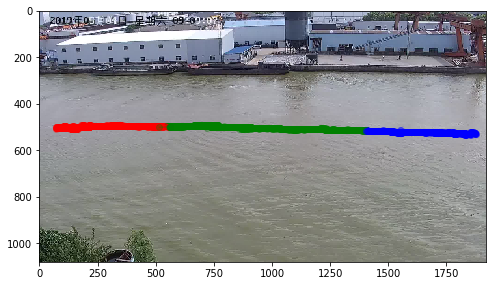

4 1439


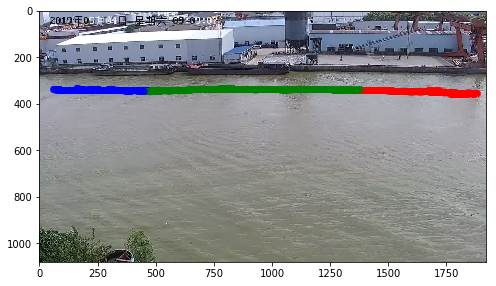

5 1418


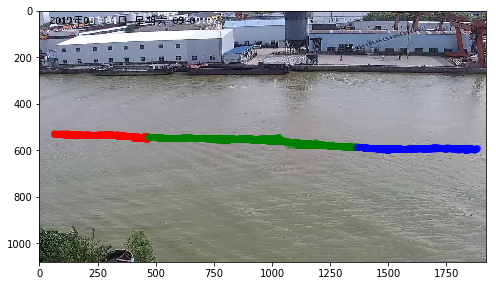

6 1408


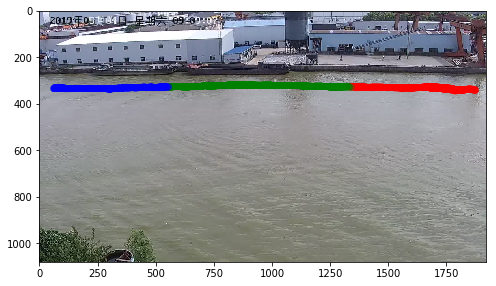

7 1365


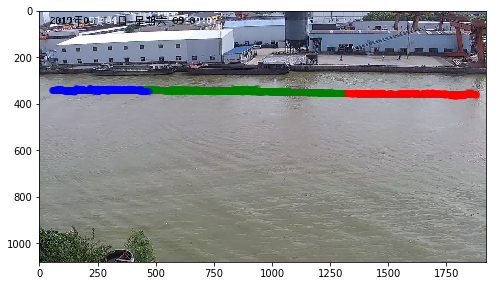

8 1266


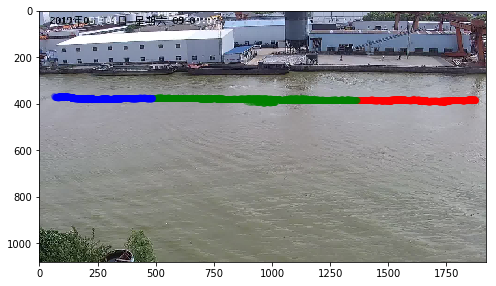

9 1226


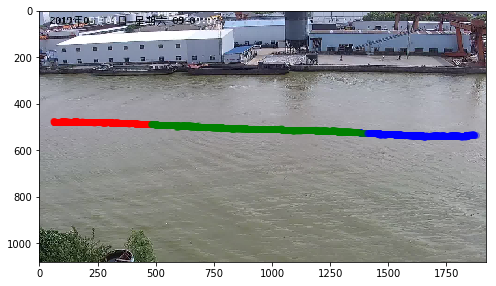

10 1210


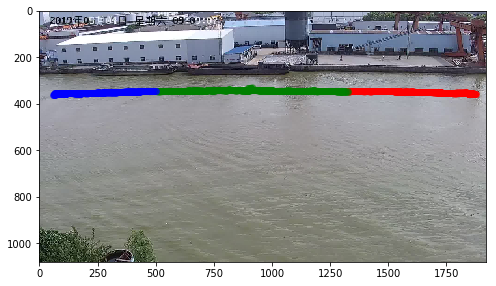

11 911


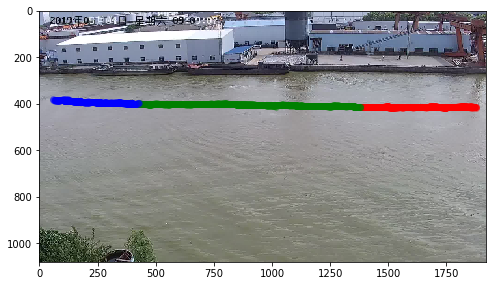

12 763


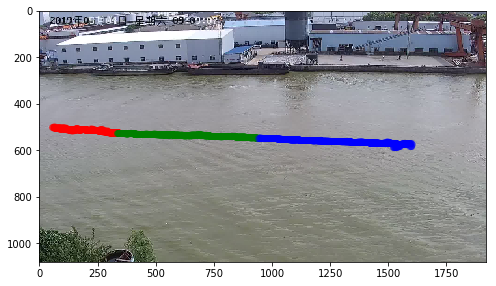

13 735


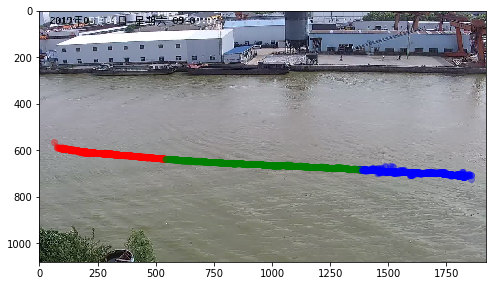

14 655


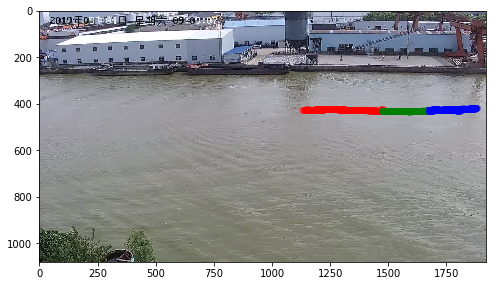

15 588


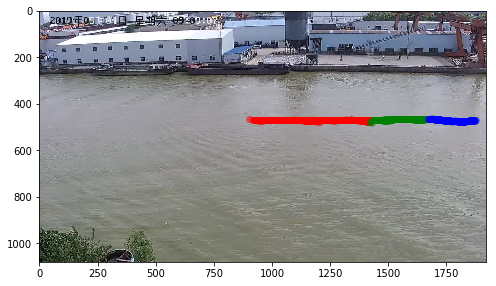

16 515


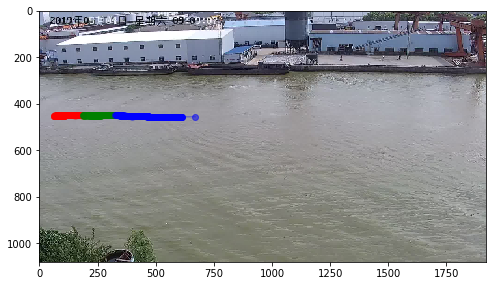

17 180


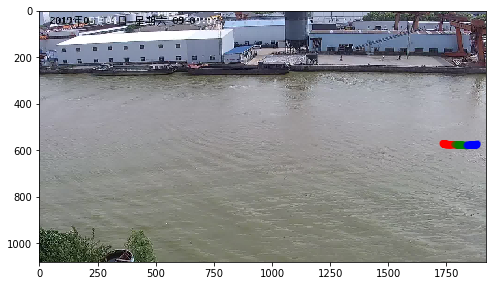

18 2


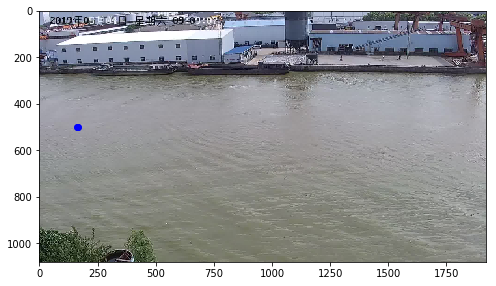

In [34]:
for idx,chain in enumerate(sorted([chain for chain in collected['chain_list']], reverse=True, key=len)[:21]):
    pt_arr = np.array([box['pt'] for box in chain])
    pt_smoothed_arr = np.array([box['pt_smoothed'] for box in chain])
    if len(pt_arr) <2:
        print('suppressed')
        continue
    print(idx,len(pt_arr))
    x,y = pt_arr[:,::2].mean(axis=1),pt_arr[:,1::2].mean(axis=1)
    x_bar,y_bar = pt_smoothed_arr[:,::2].mean(axis=1),pt_smoothed_arr[:,1::2].mean(axis=1)
    
    plt.figure(figsize=(8,6))
    plot_trace(x_bar, y_bar)
    plot_trace(x,y, alpha=0.3)
    plt.imshow(background)
    plt.show()

In [33]:
chain_list = sorted([chain for chain in collected['chain_list']], reverse=True, key=len)

In [41]:
chain_list[14][:3]

[{'score': tensor(0.6613, device='cpu'),
  'label_name': 'boat',
  'pt': array([ 641.46985,  366.86548, 1621.0024 ,  484.81952], dtype=float32),
  'matched': True,
  'head': True,
  'frame': 0,
  'pt_smoothed': array([ 662.5952 ,  366.78348, 1649.5939 ,  484.3408 ], dtype=float32),
  'pt_smoothed_next': array([ 663.2813 ,  366.7743 , 1650.5884 ,  484.32333], dtype=float32),
  'pt_next': array([ 647.1117 ,  365.8454 , 1626.4069 ,  483.74542], dtype=float32),
  'delta': array([ 0.84033203, -0.01330566], dtype=float32),
  'delta_smoothed': array([ 0.973114  , -0.02756424], dtype=float32),
  'chain': <test_batch.DummyPointer at 0x2bff5f4b780>},
 {'score': tensor(0.6514, device='cpu'),
  'label_name': 'boat',
  'pt': array([ 647.1117 ,  365.8454 , 1626.4069 ,  483.74542], dtype=float32),
  'matched': True,
  'frame': 1,
  'pt_smoothed': array([ 663.2813 ,  366.7743 , 1650.5884 ,  484.32333], dtype=float32),
  'pt_smoothed_next': array([ 664.33704,  366.76456, 1651.4806 ,  484.25073], dtype=

In [42]:
chain_list[15][:3]

[{'score': tensor(0.1533, device='cpu'),
  'label_name': 'boat',
  'pt': array([ 459.20618,  412.9377 , 1346.726  ,  520.9063 ], dtype=float32),
  'matched': True,
  'head': True,
  'frame': 2638,
  'pt_smoothed': array([ 511.78308,  414.5778 , 1404.1761 ,  522.33154], dtype=float32),
  'pt_smoothed_next': array([ 513.80804,  414.59598, 1406.2737 ,  522.3463 ], dtype=float32),
  'pt_next': array([ 459.7864,  413.5016, 1350.0549,  520.7059], dtype=float32),
  'delta': array([2.0612793 , 0.01647949], dtype=float32),
  'delta_smoothed': array([2.1559205 , 0.02191467], dtype=float32),
  'chain': <test_batch.DummyPointer at 0x2bffde69390>},
 {'score': tensor(0.1645, device='cpu'),
  'label_name': 'boat',
  'pt': array([ 459.7864,  413.5016, 1350.0549,  520.7059], dtype=float32),
  'matched': True,
  'frame': 2639,
  'pt_smoothed': array([ 513.80804,  414.59598, 1406.2737 ,  522.3463 ], dtype=float32),
  'pt_smoothed_next': array([ 515.8231 ,  414.61353, 1408.4246 ,  522.3639 ], dtype=float3

In [39]:
chain_list[16][:3]

[{'score': tensor(0.1629, device='cpu'),
  'label_name': 'boat',
  'pt': array([ -2.6026654, 417.84906  , 127.8996   , 484.7187   ], dtype=float32),
  'matched': True,
  'head': True,
  'frame': 1940,
  'pt_smoothed': array([  0.8812986, 415.7671   , 138.86832  , 485.47565  ], dtype=float32),
  'pt_smoothed_next': array([  0.9131223, 415.71857  , 139.38571  , 485.5053   ], dtype=float32),
  'pt_next': array([ -0.6423998, 416.4739   , 126.63911  , 485.61923  ], dtype=float32),
  'delta': array([ 0.2746048 , -0.00942993], dtype=float32),
  'delta_smoothed': array([ 0.33586788, -0.0065094 ], dtype=float32),
  'chain': <test_batch.DummyPointer at 0x2bff7b43128>},
 {'score': tensor(0.2216, device='cpu'),
  'label_name': 'boat',
  'pt': array([ -0.6423998, 416.4739   , 126.63911  , 485.61923  ], dtype=float32),
  'matched': True,
  'frame': 1941,
  'pt_smoothed': array([  0.9131223, 415.71857  , 139.38571  , 485.5053   ], dtype=float32),
  'pt_smoothed_next': array([  0.9945128, 415.6442   ,

In [40]:
chain_list[16][-3:]

[{'score': tensor(0.1566, device='cpu'),
  'label_name': 'boat',
  'pt': array([ 185.50174,  409.89203, 1000.214  ,  501.68118], dtype=float32),
  'matched': True,
  'frame': 2458,
  'pt_smoothed': array([ 207.36911,  410.23965, 1008.096  ,  501.6717 ], dtype=float32),
  'pt_smoothed_next': array([ 209.23631,  410.2525 , 1010.05707,  501.66217], dtype=float32),
  'pt_next': array([ 267.13354,  409.0351 , 1069.9844 ,  502.05084], dtype=float32),
  'delta': array([1.9141235e+00, 1.6479492e-03], dtype=float32),
  'delta_smoothed': array([ 2.0115738 , -0.00337906], dtype=float32),
  'chain': <test_batch.DummyPointer at 0x2bffde692e8>},
 {'score': tensor(0.1631, device='cpu'),
  'label_name': 'boat',
  'pt': array([ 267.13354,  409.0351 , 1069.9844 ,  502.05084], dtype=float32),
  'matched': True,
  'frame': 2505,
  'pt_smoothed': array([ 209.23631,  410.2525 , 1010.05707,  501.66217], dtype=float32),
  'pt_smoothed_next': array([ 211.15067,  410.25595, 1012.007  ,  501.64365], dtype=float3

看起来序列16（末帧2511）与序列17（初帧2638）本来应该是连在一起的，但由于不明原因中间的帧一次在波门的对象都没检测到
（当然成段的missing也是很合理的，因为本来条件就没有很大变化，一开始missing很大概率后面还是missing。这可不是什么白噪声造成的，
所以使用卡尔曼滤波器效果存疑。）

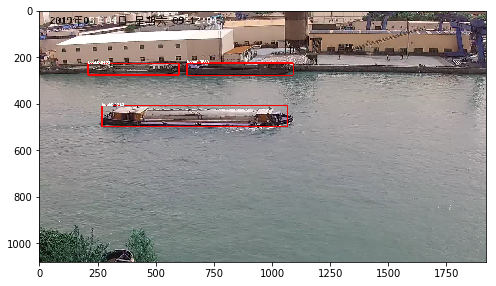

In [43]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00801_frames\thumb02512.jpg', threshold=0.15)
plt.figure(figsize=(8,6))
plt.imshow(processed)

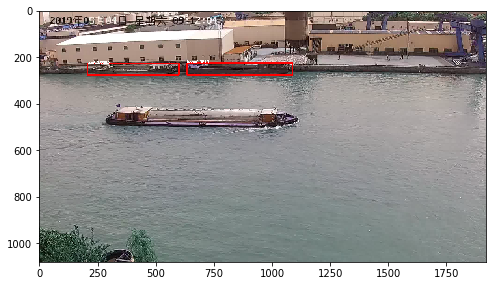

In [45]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00801_frames\thumb02522.jpg', threshold=0.15)
plt.figure(figsize=(8,6))
plt.imshow(processed)

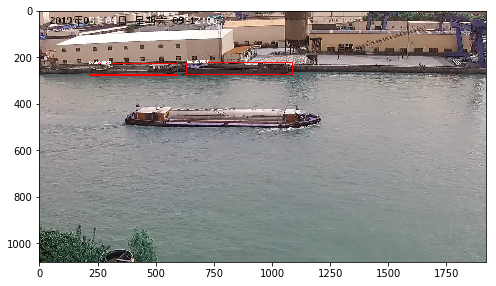

In [50]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00801_frames\thumb02572.jpg', threshold=0.15)
plt.figure(figsize=(8,6))
plt.imshow(processed)

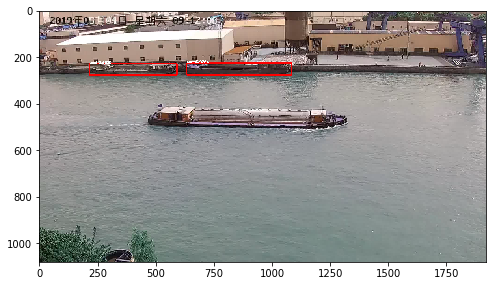

In [51]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00801_frames\thumb02628.jpg', threshold=0.15)
plt.figure(figsize=(8,6))
plt.imshow(processed)

In [ ]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00801_frames\thumb02532.jpg', threshold=0.15)
plt.figure(figsize=(8,6))
plt.imshow(processed)

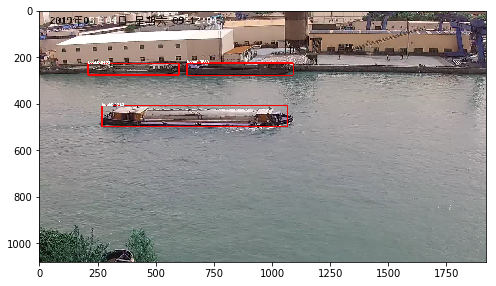

In [47]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00801_frames\thumb02512.jpg', threshold=0.1)
plt.figure(figsize=(8,6))
plt.imshow(processed)

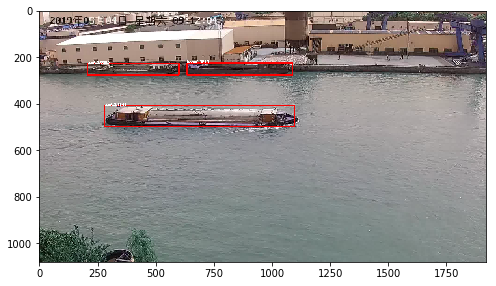

In [48]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00801_frames\thumb02522.jpg', threshold=0.1)
plt.figure(figsize=(8,6))
plt.imshow(processed)

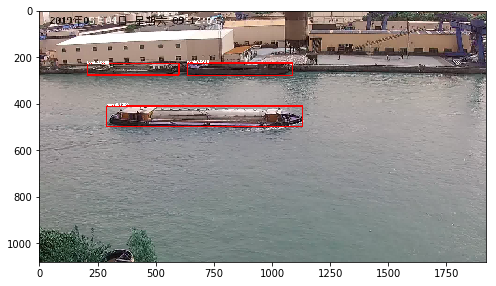

In [49]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00801_frames\thumb02532.jpg', threshold=0.1)
plt.figure(figsize=(8,6))
plt.imshow(processed)

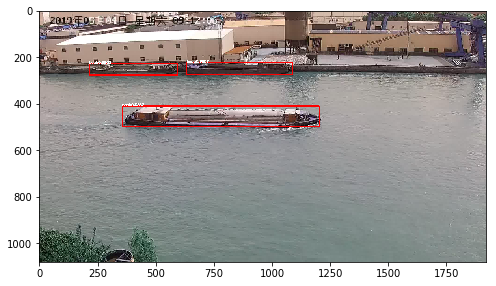

In [80]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00801_frames\thumb02572.jpg', threshold=0.08)
plt.figure(figsize=(8,6))
plt.imshow(processed)

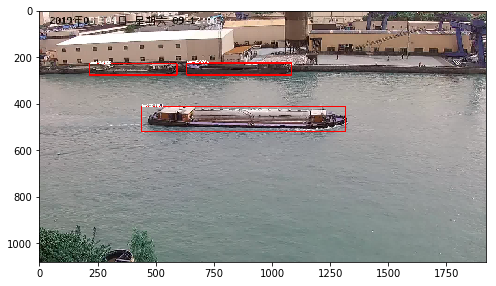

In [53]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00801_frames\thumb02628.jpg', threshold=0.1)
plt.figure(figsize=(8,6))
plt.imshow(processed)

看起来调低阈值可以降低这个问题，但调低阈值还带来那种重叠误检的问题比较讨厌。大致试一下降到多大程度比较合适。

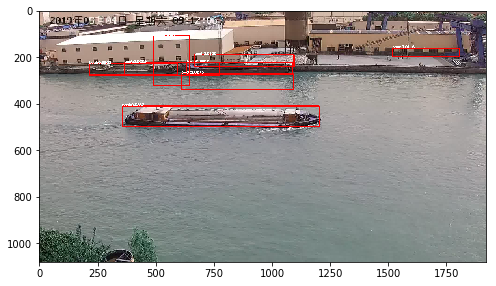

In [57]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00801_frames\thumb02572.jpg', threshold=0.01)
plt.figure(figsize=(8,6))
plt.imshow(processed)

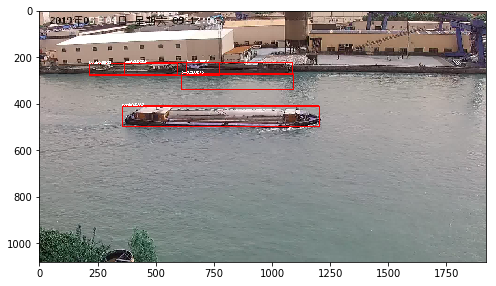

In [58]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00801_frames\thumb02572.jpg', threshold=0.02)
plt.figure(figsize=(8,6))
plt.imshow(processed)

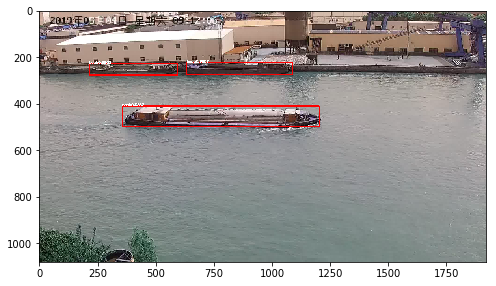

In [59]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00801_frames\thumb02572.jpg', threshold=0.04)
plt.figure(figsize=(8,6))
plt.imshow(processed)

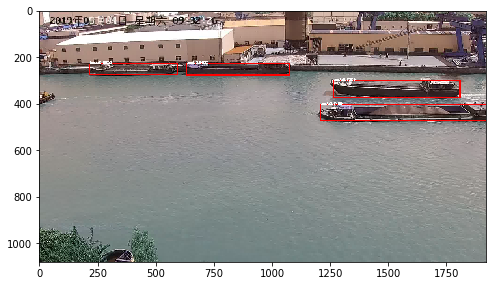

In [62]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00803_frames\thumb07166.jpg', threshold=0.05)
plt.figure(figsize=(8,6))
plt.imshow(processed)

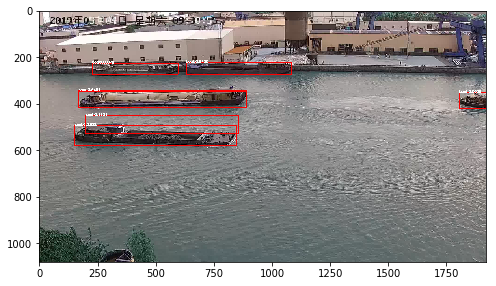

In [63]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00803_frames\thumb04901.jpg', threshold=0.05)
plt.figure(figsize=(8,6))
plt.imshow(processed)

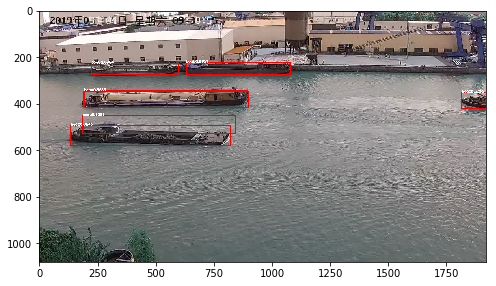

In [65]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00803_frames\thumb04891.jpg', threshold=0.05)
plt.figure(figsize=(8,6))
plt.imshow(processed)

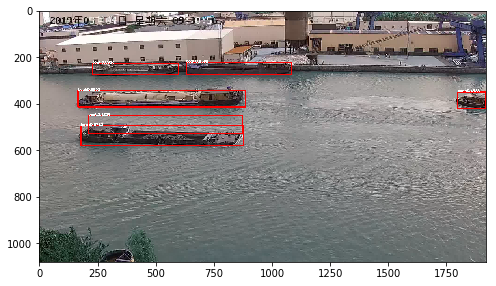

In [66]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00803_frames\thumb04911.jpg', threshold=0.05)
plt.figure(figsize=(8,6))
plt.imshow(processed)

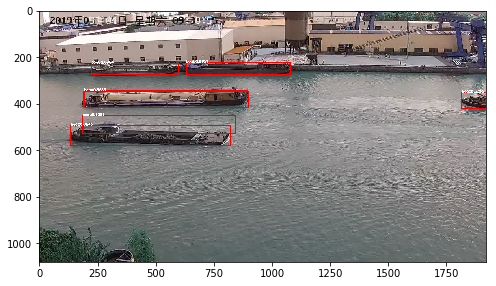

In [69]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00803_frames\thumb04891.jpg', threshold=0.1)
plt.figure(figsize=(8,6))
plt.imshow(processed)

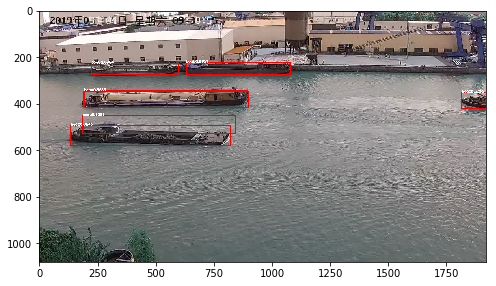

In [71]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00803_frames\thumb04891.jpg', threshold=0.125)
plt.figure(figsize=(8,6))
plt.imshow(processed)

既然这种误检连0.125阈值都去不掉(之前用的0.15可以去掉)，那就没必要由阈值处理了。阈值主要要保证0.01，0.02阈值那种明显的错误能消除。
在此基础上轨迹能连起来一切都会好起来的。

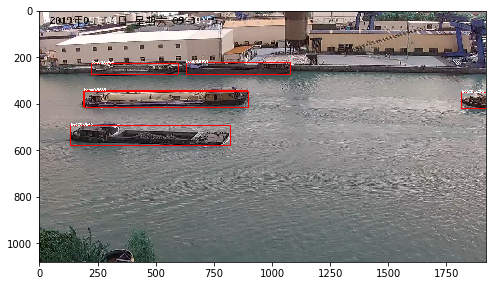

In [72]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00803_frames\thumb04891.jpg', threshold=0.15)
plt.figure(figsize=(8,6))
plt.imshow(processed)

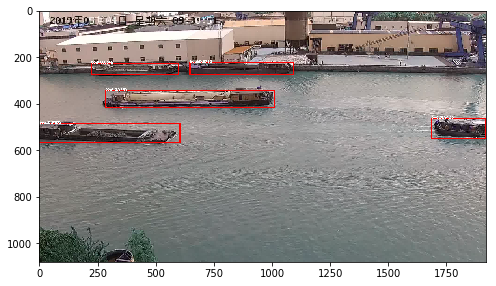

In [73]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00803_frames\thumb04791.jpg', threshold=0.05)
plt.figure(figsize=(8,6))
plt.imshow(processed)

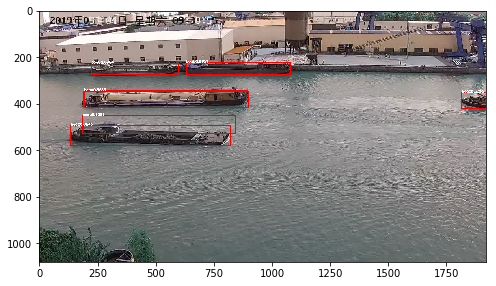

In [74]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00803_frames\thumb04891.jpg', threshold=0.05)
plt.figure(figsize=(8,6))
plt.imshow(processed)

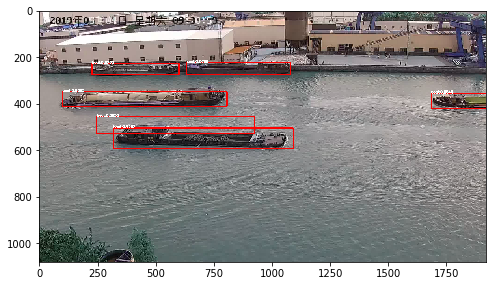

In [75]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00803_frames\thumb04991.jpg', threshold=0.05)
plt.figure(figsize=(8,6))
plt.imshow(processed)

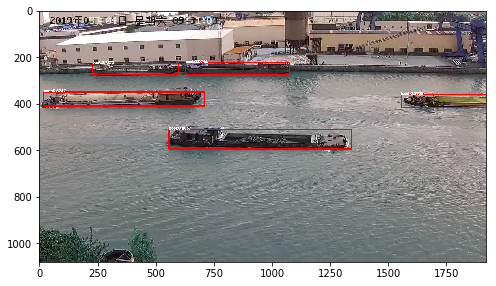

In [76]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00803_frames\thumb05091.jpg', threshold=0.05)
plt.figure(figsize=(8,6))
plt.imshow(processed)

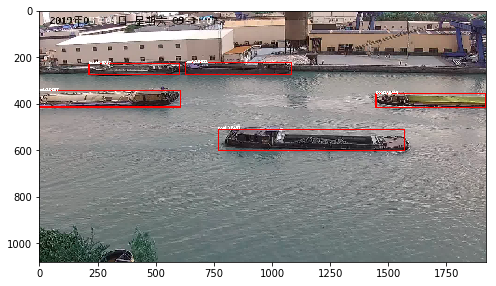

In [77]:
processed = test_basic(net, r'E:\ship_detect_demo\hiv00803_frames\thumb05191.jpg', threshold=0.05)
plt.figure(figsize=(8,6))
plt.imshow(processed)